# Description of the final project

## Introduction

In this project, you are going to work with the dataset based on the census data extracted from the 1994 and 1995 current population surveys conducted by the U.S. Census Bureau. Your goal is to predict level of income of a person: "- 50000" (means less than \$50k/year) or "50000+" (means more than \$50k/year). The data is split into train (`train.csv`) and test (`test.csv`) parts. You should use train part to train the models, and test part to estimate their final quality. The best quality on the test dataset should be your final result.

The description of the data is available here: https://archive.ics.uci.edu/ml/datasets/Census-Income+%28KDD%29

_Citation:_

* _Dua, D. and Graff, C. (2019). UCI Machine Learning Repository [http://archive.ics.uci.edu/ml]. Irvine, CA: University of California, School of Information and Computer Science._

## Detailed Task Description

The solution should have the following parts:

### [25%] 1. Data exploration

* 1.1. (8%) Which metric are you going to use to evaluate the performance of the model and why?
* 1.2. (8%) Which validation strategy are you going to use and why? Apply it to the data on the preprocessing step
* 1.3. (9%) Explore which features do you have, what is their distribution and connection to the target. Perform feature selection techniques such as PCA, and feature engineering, if necessary. Explain your decisions

### [25%] 2. Data preprocessing

* 2.1. (8%) Fill missing values (if there are any)
* 2.2. (9%) Properly encode categorical features. Explain your choice of methods of categorical feature encoding
* 2.3. (8%) Cluster observations and add cluster number as one of the features. Make sure that the clustering method has a good quality

### [25%] 3. Model training

* 3.1. (8%) Apply different techniques which can help to work with imbalanced data. You are supposed to try at least 2 techniques (in the end, you don't have to include them into your final pipeline - but you should explain why)
* 3.2. (9%) Train different machine learning models, including the advanced boosting algorithms studied during the course. Carefully tune hyperparameters of the algorithms. You are supposed to compare at least 3 models
* 3.3. (8%) Perform blending or stacking of the trained machine learning algorithms. Carefully tune the weights of the ensemble

### [25%] 4. Summary

* 4.1. (8%) Estimate the quality of the models and their ensemble on the test set. Describe the results. Which model is the best?
* 4.2. (8%) Interpret the best single model and the ensemble. Use at least 2 model interpretation techniques. Explain, why your models have good quality (or bad quality)
* 4.3. (9%) Summarize your results and write a conclusion. What have you found in the data, which techniques did you use? Which methods and models worked best in your task? Can you explain in simple words why should we trust your final model?

### General Requirements

* You should provide a solution in the form of the Jupyter Notebook with code cells and markdown cells (with text)
* Make sure that the instructor can run all the cells to reproduce your results
* Clearly answer each question, perform the required actions from the task. Explain your decisions if you choose to use some techniques
* Support all your statements with calculations and plots. For instance, if you claim that the dataset does not have missing values, you need to provide the code which shows that the total number of missing values is zero

# Solution
Egor Dontsov, 2023

## Imports and downloading data

In [1]:
from copy import deepcopy
from time import time

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as scs

from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, TargetEncoder, StandardScaler
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV, GridSearchCV, train_test_split
from sklearn.metrics import fbeta_score, make_scorer, precision_score, recall_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import NearMiss
import shap

from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

pd.options.display.max_columns = None
%matplotlib inline

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
with open('census-income.names') as f:
    print(f.read())

| This data was extracted from the census bureau database found at
| http://www.census.gov/ftp/pub/DES/www/welcome.html
| Donor: Terran Lane and Ronny Kohavi
|        Data Mining and Visualization
|        Silicon Graphics.
|        e-mail: terran@ecn.purdue.edu, ronnyk@sgi.com for questions.
|
| The data was split into train/test in approximately 2/3, 1/3
| proportions using MineSet's MIndUtil mineset-to-mlc.
|
| Prediction task is to determine the income level for the person
| represented by the record.  Incomes have been binned at the $50K
| level to present a binary classification problem, much like the
| original UCI/ADULT database.  The goal field of this data, however,
| was drawn from the "total person income" field rather than the
| "adjusted gross income" and may, therefore, behave differently than the
| orginal ADULT goal field.
|
| More information detailing the meaning of the attributes can be
| found in http://www.bls.census.gov/cps/cpsmain.htm
| To make use of the data d

In [3]:
column_names = []
continuous_features = []
nominal_features = []

with open('census-income.names') as f:
    for i, line in enumerate(f.readlines()):
        if i < 142 or i == 166:
            continue
        else:
            splitted_line = line.split(sep=':')
            column_names.append(splitted_line[0])
            if splitted_line[-1].strip() == 'continuous.':
                continuous_features.append(splitted_line[0])
            else:
                nominal_features.append(splitted_line[0])
column_names.append('income')

In [4]:
data = pd.read_csv('census-income.data', names=column_names)
data.head()

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital stat,major industry code,major occupation code,race,hispanic origin,sex,member of a labor union,reason for unemployment,full or part time employment stat,capital gains,capital losses,dividends from stocks,tax filer stat,region of previous residence,state of previous residence,detailed household and family stat,detailed household summary in household,instance weight,migration code-change in msa,migration code-change in reg,migration code-move within reg,live in this house 1 year ago,migration prev res in sunbelt,num persons worked for employer,family members under 18,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,income
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Not in labor force,0,0,0,Nonfiler,Not in universe,Not in universe,Other Rel 18+ ever marr not in subfamily,Other relative of householder,1700.09,?,?,?,Not in universe under 1 year old,?,0,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,White,All other,Male,Not in universe,Not in universe,Children or Armed Forces,0,0,0,Head of household,South,Arkansas,Householder,Householder,1053.55,MSA to MSA,Same county,Same county,No,Yes,1,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,Asian or Pacific Islander,All other,Female,Not in universe,Not in universe,Not in labor force,0,0,0,Nonfiler,Not in universe,Not in universe,Child 18+ never marr Not in a subfamily,Child 18 or older,991.95,?,?,?,Not in universe under 1 year old,?,0,Not in universe,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.
3,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Children or Armed Forces,0,0,0,Nonfiler,Not in universe,Not in universe,Child <18 never marr not in subfamily,Child under 18 never married,1758.14,Nonmover,Nonmover,Nonmover,Yes,Not in universe,0,Both parents present,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.
4,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Children or Armed Forces,0,0,0,Nonfiler,Not in universe,Not in universe,Child <18 never marr not in subfamily,Child under 18 never married,1069.16,Nonmover,Nonmover,Nonmover,Yes,Not in universe,0,Both parents present,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.


In [5]:
test = pd.read_csv('census-income.test', names=column_names)
test.head(1)

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital stat,major industry code,major occupation code,race,hispanic origin,sex,member of a labor union,reason for unemployment,full or part time employment stat,capital gains,capital losses,dividends from stocks,tax filer stat,region of previous residence,state of previous residence,detailed household and family stat,detailed household summary in household,instance weight,migration code-change in msa,migration code-change in reg,migration code-move within reg,live in this house 1 year ago,migration prev res in sunbelt,num persons worked for employer,family members under 18,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,income
0,38,Private,6,36,1st 2nd 3rd or 4th grade,0,Not in universe,Married-civilian spouse present,Manufacturing-durable goods,Machine operators assmblrs & inspctrs,White,Mexican (Mexicano),Female,Not in universe,Not in universe,Full-time schedules,0,0,0,Joint one under 65 & one 65+,Not in universe,Not in universe,Spouse of householder,Spouse of householder,1032.38,?,?,?,Not in universe under 1 year old,?,4,Not in universe,Mexico,Mexico,Mexico,Foreign born- Not a citizen of U S,0,Not in universe,2,12,95,- 50000.


## 1. Data exploration

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199523 entries, 0 to 199522
Data columns (total 42 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   age                                         199523 non-null  int64  
 1   class of worker                             199523 non-null  object 
 2   detailed industry recode                    199523 non-null  int64  
 3   detailed occupation recode                  199523 non-null  int64  
 4   education                                   199523 non-null  object 
 5   wage per hour                               199523 non-null  int64  
 6   enroll in edu inst last wk                  199523 non-null  object 
 7   marital stat                                199523 non-null  object 
 8   major industry code                         199523 non-null  object 
 9   major occupation code                       199523 non-null  object 
 

In [7]:
print('Number of duplicates:', data.duplicated().sum())

Number of duplicates: 3229


In [8]:
data.income.value_counts()

income
 - 50000.    187141
 50000+.      12382
Name: count, dtype: int64

In [9]:
data.income.value_counts(normalize=True)

income
 - 50000.    0.937942
 50000+.     0.062058
Name: proportion, dtype: float64

1.1. (8%) Which metric are you going to use to evaluate the performance of the model and why?

**Answer:**<br>
First, the choice of metric to evaluate the performance of the model depends on the business problem we are solving. Since we have many socio-demographic features, and we want to predict whether a person's income exceeds \\$50k or not, let's imagine that our business problem is to find premium customers (income > $50k). The business does not want to miss out on premium customers, so it allows non-premium customers to be predicted by the model, but there should not be very many of them, as the business does not want to spend a lot of money on false-premium customers.<br>
Second, we see that our target is highly imbalanced (0.94 vs 0.06), so we have to take that fact into account. And the business wants to avoid missing out on premium customers (minimize false negative), while minimizing the number of non-premium customers (false positive) in the prediction. Therefore, we must choose a metric that finds a compromise between false negative and false positive predictions.

Based on "demand from business" and imbalance of target as a metric to evaluate the model I will choose F-beta measure or `fbeta_score` from `sklearn`. And beta will be greater than 1 to give more weight to recall metric.

1.2. (8%) Which validation strategy are you going to use and why? Apply it to the data on the preprocessing step

**Answer:**<br>
Since we have highly imbalanced data as validation strategy I will choose `StratifiedKFold` cross-validation strategy, that splits data into k folds with roughly the same proportion of the target.

1.3. (9%) Explore which features do you have, what is their distribution and connection to the target. Perform feature selection techniques such as PCA, and feature engineering, if necessary. Explain your decisions

In [10]:
data.describe()

,age,detailed industry recode,detailed occupation recode,wage per hour,capital gains,capital losses,dividends from stocks,instance weight,num persons worked for employer,own business or self employed,veterans benefits,weeks worked in year,year
count,199523.000000,199523.000000,199523.000000,199523.000000,199523.00000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000
mean,34.494199,15.352320,11.306556,55.426908,434.71899,37.313788,197.529533,1740.380269,1.956180,0.175438,1.514833,23.174897,94.499672
std,22.310895,18.067129,14.454204,274.896454,4697.53128,271.896428,1984.163658,993.768156,2.365126,0.553694,0.851473,24.411488,0.500001
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,37.870000,0.000000,0.000000,0.000000,0.000000,94.000000
25%,15.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1061.615000,0.000000,0.000000,2.000000,0.000000,94.000000
50%,33.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1618.310000,1.000000,0.000000,2.000000,8.000000,94.000000
75%,50.000000,33.000000,26.000000,0.000000,0.00000,0.000000,0.000000,2188.610000,4.000000,0.000000,2.000000,52.000000,95.000000
max,90.000000,51.000000,46.000000,9999.000000,99999.00000,4608.000000,99999.000000,18656.300000,6.000000,2.000000,2.000000,52.000000,95.000000


In [11]:
data.describe(include='O')

,class of worker,education,enroll in edu inst last wk,marital stat,major industry code,major occupation code,race,hispanic origin,sex,member of a labor union,reason for unemployment,full or part time employment stat,tax filer stat,region of previous residence,state of previous residence,detailed household and family stat,detailed household summary in household,migration code-change in msa,migration code-change in reg,migration code-move within reg,live in this house 1 year ago,migration prev res in sunbelt,family members under 18,country of birth father,country of birth mother,country of birth self,citizenship,fill inc questionnaire for veteran's admin,income
count,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523,199523
unique,9,17,3,7,24,15,5,10,2,3,6,8,6,6,51,38,8,10,9,10,3,4,5,43,43,43,5,3,2
top,Not in universe,High school graduate,Not in universe,Never married,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Children or Armed Forces,Nonfiler,Not in universe,Not in universe,Householder,Householder,?,?,?,Not in universe under 1 year old,?,Not in universe,United-States,United-States,United-States,Native- Born in the United States,Not in universe,- 50000.
freq,100245,48407,186943,86485,100684,100684,167365,171907,103984,180459,193453,123769,75094,183750,183750,53248,75475,99696,99696,99696,101212,99696,144232,159163,160479,176989,176992,197539,187141


From `census-income.names` we know that our dataset contains 2 classes of features - continuous and nominal, some of them are numeric, some strings.

### Feature distriburions

In [12]:
def bin_width(x):
    "Function calculates bin's width"
    iqr = np.percentile(x, 75) - np.percentile(x, 25)
    if iqr != 0:
        return 2 * iqr / len(x)**(1 / 3)
    return 3.49 * np.std(x) / len(x)**(1 / 3)


def n_bins(x):
    "Function calculates number of bins of histogram"
    return int((np.max(x) - np.min(x)) / bin_width(x))

In [13]:
def plot_continuous_distributions(feature_list):
    fig = plt.figure(figsize=(10, 6 * len(feature_list)))
    subfigs = fig.subfigures(len(feature_list), 1)

    for i, feature in enumerate(continuous_features):
        ax_box, ax_hist = subfigs[i].subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': (.2, .8)})

        sns.boxplot(x=data[feature], ax=ax_box, color='salmon')
        ax_box.set_title(f'Distribution of {feature}')
        ax_box.set(yticks=[])

        sns.histplot(data[feature], bins=n_bins(data[feature]), kde=True, ax=ax_hist, color='skyblue')
        ax_hist.axvline(np.mean(data[feature]), color='g', linestyle='-', label='mean')
        ax_hist.axvline(np.median(data[feature]), color='y', linestyle='--', label='median')
        ax_hist.legend()
        ax_hist.set_xlabel(feature)
        ax_hist.set_ylabel('Frequency')

        sns.despine(ax=ax_hist)
        sns.despine(ax=ax_box, left=True)
    # plt.tight_layout()
    plt.show()

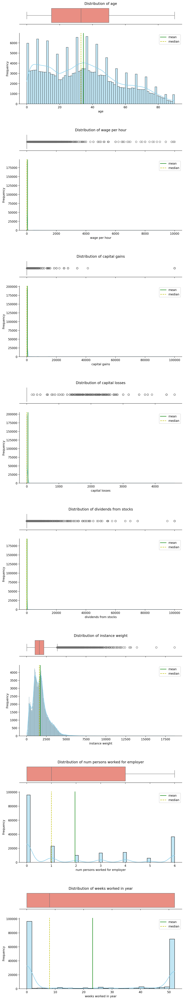

In [14]:
plot_continuous_distributions(continuous_features)

We see that there are outliers in capital and wage related features.

In [15]:
continuous_outliers_feat = ['capital gains', 'capital losses', 'dividends from stocks']

In [16]:
def plot_nominal_distributions(features_list):
    fig, axes = plt.subplots(nrows=len(features_list), ncols=1, figsize=(12, 6 * len(features_list)))
    for i, feature in enumerate(features_list):
        sns.countplot(y=feature, data=data, ax=axes[i], stat='proportion')
        axes[i].set_title(f'Distribution of {feature}')
        axes[i].tick_params(axis='x', rotation=45, labelsize=7)
        axes[i].tick_params(axis='y', labelsize=8)
    plt.tight_layout()
    plt.show()

In [17]:
plot_nominal_distributions(nominal_features)

We see, that missing values in nominal features are filled with `?`. <br>
Also several nominal features have a dominant category `Not in universe`, and features such as `fill inc questionnaire for veteran's admin` or `region of previous residence` have too many values of this category and this information will likely not help our model predict results. I interpret this category to mean that this feature/survey question couldn't be applied to the person.<br>
Let's look at connection between features and target.

### Connection to the target

In [18]:
def plot_countplot_target_connection(features_list):
    fig, axes = plt.subplots(nrows=len(features_list), ncols=1, figsize=(12, 6 * len(features_list)))
    for i, feature in enumerate(features_list):
        sns.countplot(y=feature, hue='income', data=data, ax=axes[i], stat='proportion')
        axes[i].set_title(f'Connection to the target of {feature}')
        axes[i].tick_params(axis='x', rotation=45, labelsize=7)
        axes[i].tick_params(axis='y', labelsize=8)
        axes[i].legend(loc='lower right')
    plt.tight_layout()
    plt.show()

In [19]:
plot_countplot_target_connection(nominal_features)

- It seems like such features as `enroll in edu inst last wk`, `hispanic origin`, `reason for unemployment`, `region of previous residence`, `family members under 18` don't give us much information about target, because \$50k+ target is presented mostly in dominant category of these features. Feature `state of previous residence` is intuitively highly correlated with `region of previous residence`, so I will drop it.
- Features `country of birth...`, `migration code-change...`  include redundant categories, which could have been handled on the preprocessing step. And we have to check if these features correlate with each other, if yes, then we can apply PCA.
- The dataset contains feature `education` which may be considered as an ordinal feature.
- I still don't understand the point of feature `year`. Most likely we will drop it.
- Some features look like candidates for one-hot encoding (e.g. `sex`, `live in this house 1 year ago`), because they include not many classes. Others (e.g. `class of worker`, `detailed industry recode`) include more classes, so we can encode them using target encoding.

In [20]:
country_of_birth = ['country of birth father', 'country of birth mother', 'country of birth self']  # OHE + PCA
migration_code_cols = ['migration code-change in msa', 'migration code-change in reg',
                       'migration code-move within reg']  # OHE + PCA

uninform_features = ['enroll in edu inst last wk', 'hispanic origin', 'reason for unemployment',
                     'region of previous residence', 'family members under 18',
                     'fill inc questionnaire for veteran\'s admin', 'veterans benefits']  # cluster

ordinal_cols = ['education']  # OrdinalEncoding with handling infrequent classes
ohe_cols = ['sex', 'live in this house 1 year ago', 'migration prev res in sunbelt',
            'own business or self employed']  # OHE with handling infrequent classes

target_enc_cols = ['class of worker', 'detailed industry recode', 'detailed occupation recode',
                   'marital stat', 'major industry code', 'major occupation code', 'race',
                   'member of a labor union', 'full or part time employment stat', 'tax filer stat',
                   'citizenship', 'detailed household and family stat', 'detailed household summary in household']  # TODO check other columns

drop_cols = ['state of previous residence']

In [21]:
def plot_kde_target_connection(features_list):
    fig, axes = plt.subplots(nrows=len(features_list), ncols=1, figsize=(12, 6 * len(features_list)))
    for i, feature in enumerate(features_list):
        sns.kdeplot(data=data, x=feature, hue='income', fill=True, ax=axes[i])
        axes[i].set_title(f'Connection between {feature} and income')
    plt.show()

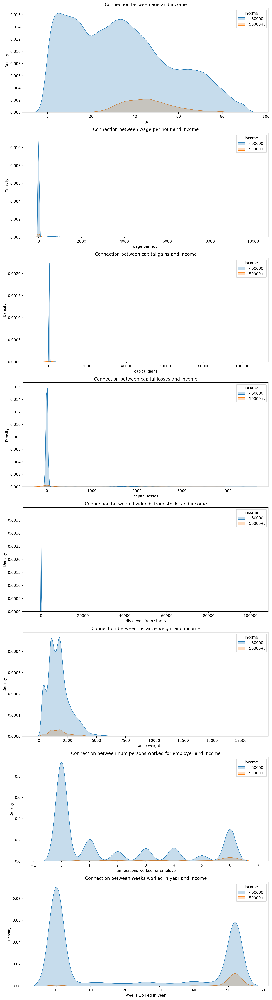

In [22]:
plot_kde_target_connection(continuous_features)

I think that we pretty enough explored features, further analysis should be continued after data preprocessing.

### EDA summary

1. There are 3229 duplicated rows in the dataset.
2. The target variable `income` is highly imbalanced.
3. The dataset consists of 7 continuous and 33 nominal features.
4. Features in `continuous_outliers_feat` list are likely to have outliers which we should investigate and make a decision about handling them.
5. `country of birth...`, `migration code-change...` features include redundant classes, which could have been handled.
6. Features from `uninform_features` list most likely don't give us much information about target, because \$50k+ target is presented mostly in dominant category of these features. So we should consider applying clustering technique to reduce number of such features or even drop them.
7. Missing values are encoded with the symbol `?`. These are presented mainly in features to which PCA or clustering will be applied.

## 2. Data preprocessing

In [23]:
data.income.unique()

array([' - 50000.', ' 50000+.'], dtype=object)

In [24]:
RANDOM_STATE = 42
data['target'] = (data.income == ' 50000+.').astype(int)
data.drop(columns='income', inplace=True)
data.target.value_counts(normalize=True)

target
0    0.937942
1    0.062058
Name: proportion, dtype: float64

In [25]:
data.drop_duplicates(inplace=True)
print('Number of duplicates:', data.duplicated().sum())

Number of duplicates: 0


In the `census-income.names` file we see this sentence: "The instance weight indicates the number of people in the populationthat each record represents due to stratified sampling. To do real analysis and derive conclusions, this field must be used. This attribute should *not* be used in the classifiers, so it is set to "ignore" in this file." <br>
Since we are solving a classification problem, let's add this feature to drop-candidates list.

In [26]:
drop_cols.append('instance weight')

Let's take a look at features from `continuous_outliers_feat` list.

In [27]:
data[continuous_outliers_feat].describe()

,capital gains,capital losses,dividends from stocks
count,196294.000000,196294.000000,196294.000000
mean,441.870037,37.927593,200.722386
std,4735.677027,274.081174,2000.130616
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000
max,99999.000000,4608.000000,99999.000000


In [28]:
data[continuous_outliers_feat].corr()

,capital gains,capital losses,dividends from stocks
capital gains,1.000000,-0.012912,0.131355
capital losses,-0.012912,1.000000,0.042219
dividends from stocks,0.131355,0.042219,1.000000


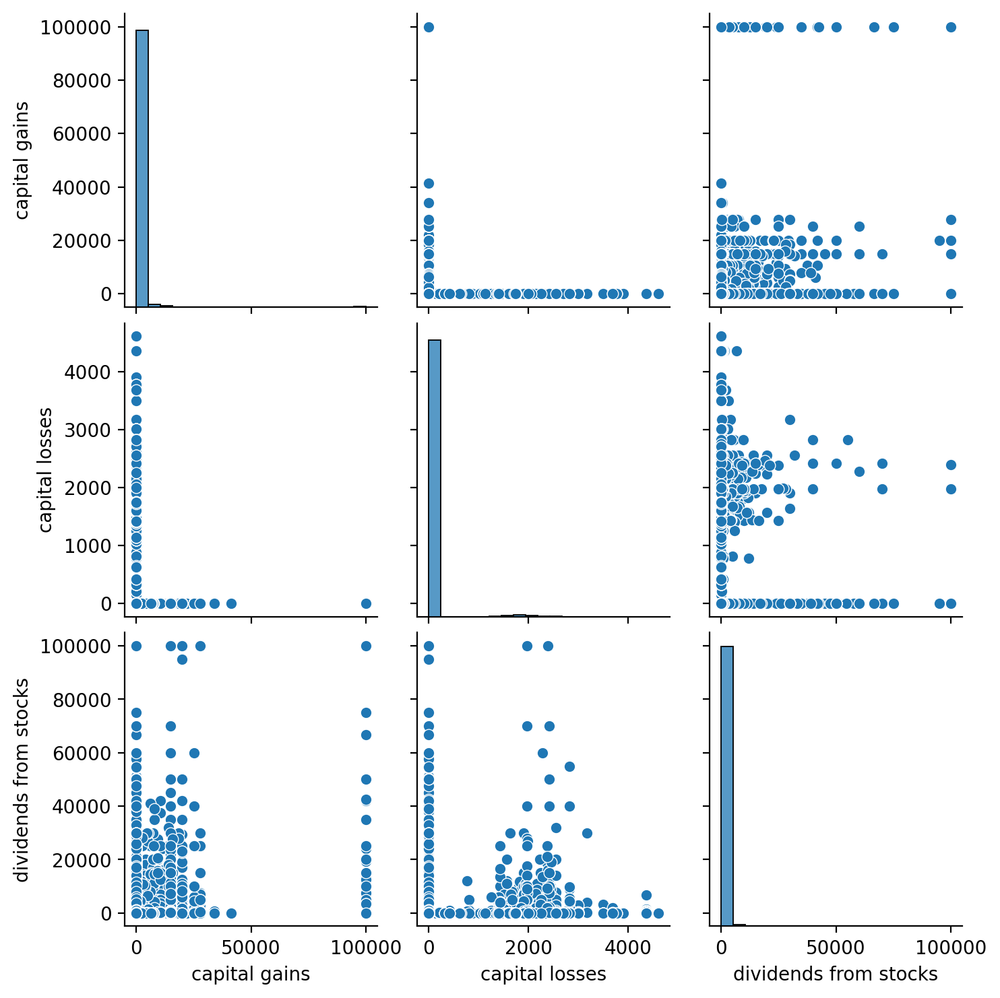

In [29]:
sns.pairplot(data[continuous_outliers_feat])
plt.show()

In [30]:
data[continuous_outliers_feat][(data['capital gains'] > 0) | (
    data['capital losses'] > 0) | (data['dividends from stocks'] > 0)].shape

(29354, 3)

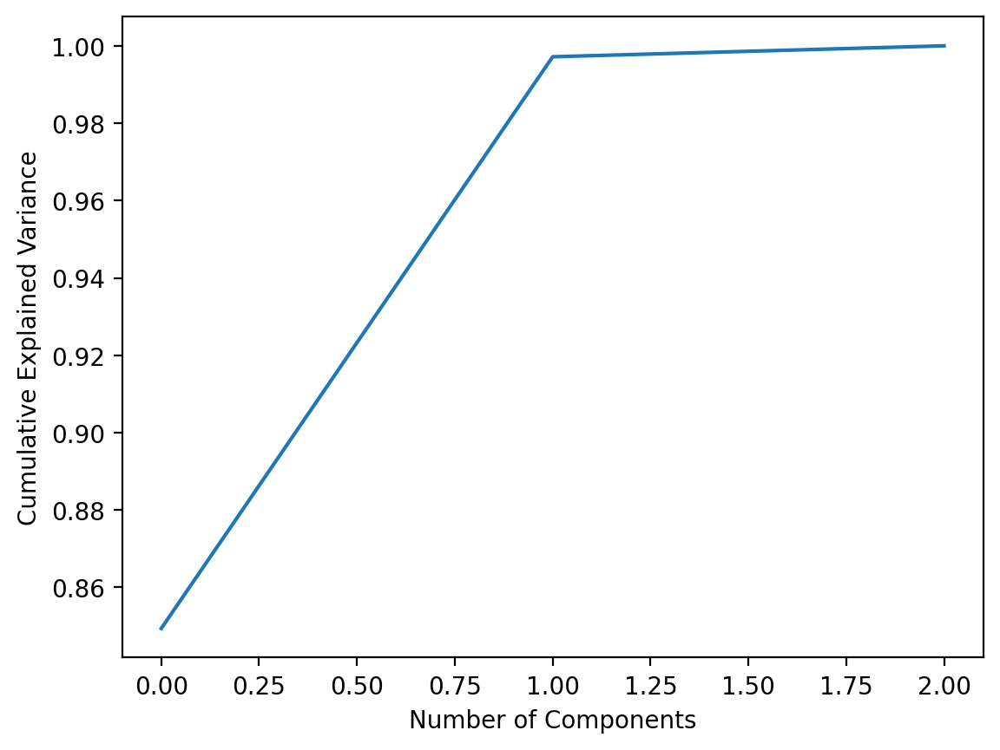

In [31]:
pca = PCA()
pca.fit(data[continuous_outliers_feat])

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

The data from these 3 features looks weird to me, so I just transform them into 1 feature using the first component of PCA.

In [32]:
pca_capital = PCA(n_components=1, random_state=RANDOM_STATE)
drop_cols.extend(continuous_outliers_feat)
pca_capital.fit_transform(data[continuous_outliers_feat])

array([[-454.31106606],
       [-454.31106606],
       [-454.31106606],
       ...,
       [-443.78172303],
       [-454.31106606],
       [-454.31106606]])

Let's consider nominal features with redundant categories. `country of birth...` and `migration code-change...`.

In [33]:
country_ohe = OneHotEncoder(drop='if_binary', sparse_output=False,
                            handle_unknown='infrequent_if_exist', min_frequency=0.03)
country_data = country_ohe.fit_transform(data[country_of_birth])
pd.DataFrame(np.corrcoef(country_data, rowvar=False),
             index=country_ohe.get_feature_names_out(), columns=country_ohe.get_feature_names_out())

,country of birth father_ ?,country of birth father_ Mexico,country of birth father_ United-States,country of birth father_infrequent_sklearn,country of birth mother_ ?,country of birth mother_ Mexico,country of birth mother_ United-States,country of birth mother_infrequent_sklearn,country of birth self_infrequent_sklearn
country of birth father_ ?,1.000000,-0.043444,-0.370185,-0.069519,0.753149,-0.039299,-0.290194,-0.020209,0.216420
country of birth father_ Mexico,-0.043444,1.000000,-0.454884,-0.085426,-0.039664,0.862564,-0.394867,-0.070712,0.317528
country of birth father_ United-States,-0.370185,-0.454884,1.000000,-0.727903,-0.294943,-0.404611,0.822779,-0.586762,-0.656426
country of birth father_infrequent_sklearn,-0.069519,-0.085426,-0.727903,1.000000,-0.027642,-0.057467,-0.593045,0.787342,0.479889
country of birth mother_ ?,0.753149,-0.039664,-0.294943,-0.027642,1.000000,-0.040903,-0.360223,-0.065461,0.230279
country of birth mother_ Mexico,-0.039299,0.862564,-0.404611,-0.057467,-0.040903,1.000000,-0.458859,-0.083385,0.330527
country of birth mother_ United-States,-0.290194,-0.394867,0.822779,-0.593045,-0.360223,-0.458859,1.000000,-0.734353,-0.679483
country of birth mother_infrequent_sklearn,-0.020209,-0.070712,-0.586762,0.787342,-0.065461,-0.083385,-0.734353,1.000000,0.494168
country of birth self_infrequent_sklearn,0.216420,0.317528,-0.656426,0.479889,0.230279,0.330527,-0.679483,0.494168,1.000000


As it was expected `country_of_birth...` features are correlated. We can apply PCA to reduce dimensionality.

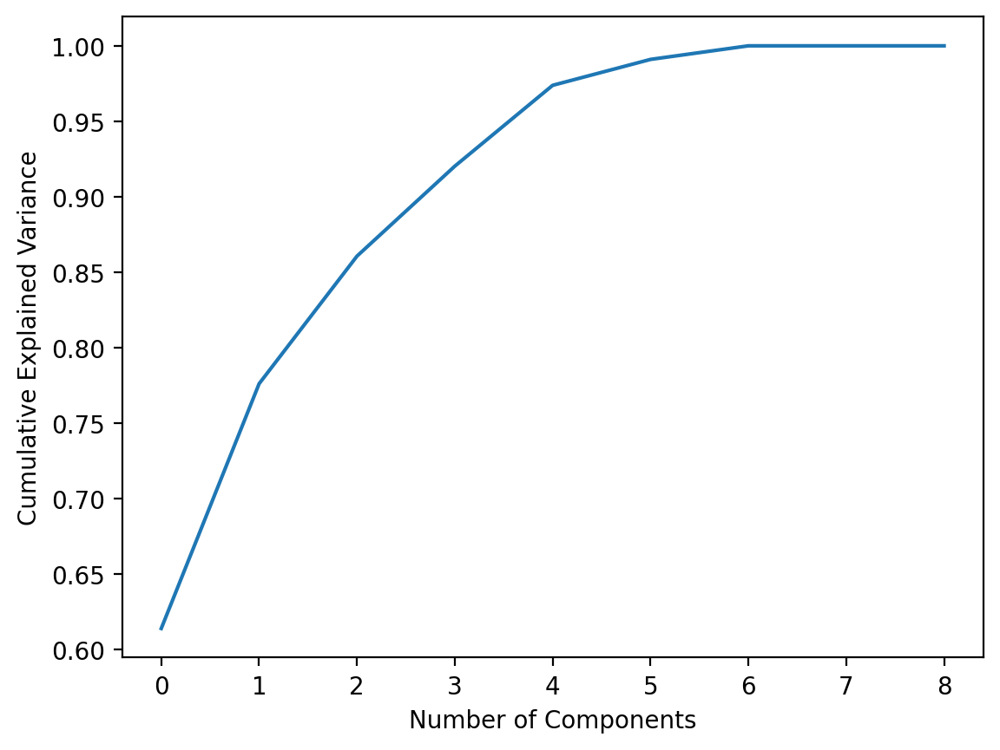

In [34]:
pca = PCA(random_state=RANDOM_STATE)
pca.fit(country_data)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [35]:
(np.cumsum(pca.explained_variance_ratio_) > 0.95).argmax()

4

In [36]:
country_pipe = Pipeline(
    [
        ('ohe_country_of_birth',
         OneHotEncoder(drop='if_binary', sparse_output=False,
                       handle_unknown='infrequent_if_exist', min_frequency=0.03)),
        ('pca_country_of_birth',
         PCA(n_components=4, random_state=RANDOM_STATE))
    ],
)
country_pipe.fit_transform(data[country_of_birth])

array([[-0.35929514, -0.02391803, -0.00825193,  0.01530432],
       [-0.35929514, -0.02391803, -0.00825193,  0.01530432],
       [ 1.79534741, -0.50610226, -0.071335  ,  0.28341607],
       ...,
       [ 1.79534742, -0.50610226, -0.071335  ,  0.28341607],
       [-0.35929514, -0.02391803, -0.00825193,  0.01530432],
       [ 1.19596161,  0.69524193,  1.40660411,  0.20707498]])

In [37]:
migration_ohe = OneHotEncoder(drop='if_binary', sparse_output=False,
                              handle_unknown='infrequent_if_exist', min_frequency=.1)
migration_data = migration_ohe.fit_transform(data[migration_code_cols])
pd.DataFrame(np.corrcoef(migration_data, rowvar=False),
             index=migration_ohe.get_feature_names_out(), columns=migration_ohe.get_feature_names_out())

,migration code-change in msa_ ?,migration code-change in msa_ Nonmover,migration code-change in msa_infrequent_sklearn,migration code-change in reg_ ?,migration code-change in reg_ Nonmover,migration code-change in reg_infrequent_sklearn,migration code-move within reg_ ?,migration code-move within reg_ Nonmover,migration code-move within reg_infrequent_sklearn
migration code-change in msa_ ?,1.000000,-0.838184,-0.309002,1.000000,-0.838184,-0.309002,1.000000,-0.838184,-0.309002
migration code-change in msa_ Nonmover,-0.838184,1.000000,-0.259698,-0.838184,1.000000,-0.259698,-0.838184,1.000000,-0.259698
migration code-change in msa_infrequent_sklearn,-0.309002,-0.259698,1.000000,-0.309002,-0.259698,1.000000,-0.309002,-0.259698,1.000000
migration code-change in reg_ ?,1.000000,-0.838184,-0.309002,1.000000,-0.838184,-0.309002,1.000000,-0.838184,-0.309002
migration code-change in reg_ Nonmover,-0.838184,1.000000,-0.259698,-0.838184,1.000000,-0.259698,-0.838184,1.000000,-0.259698
migration code-change in reg_infrequent_sklearn,-0.309002,-0.259698,1.000000,-0.309002,-0.259698,1.000000,-0.309002,-0.259698,1.000000
migration code-move within reg_ ?,1.000000,-0.838184,-0.309002,1.000000,-0.838184,-0.309002,1.000000,-0.838184,-0.309002
migration code-move within reg_ Nonmover,-0.838184,1.000000,-0.259698,-0.838184,1.000000,-0.259698,-0.838184,1.000000,-0.259698
migration code-move within reg_infrequent_sklearn,-0.309002,-0.259698,1.000000,-0.309002,-0.259698,1.000000,-0.309002,-0.259698,1.000000


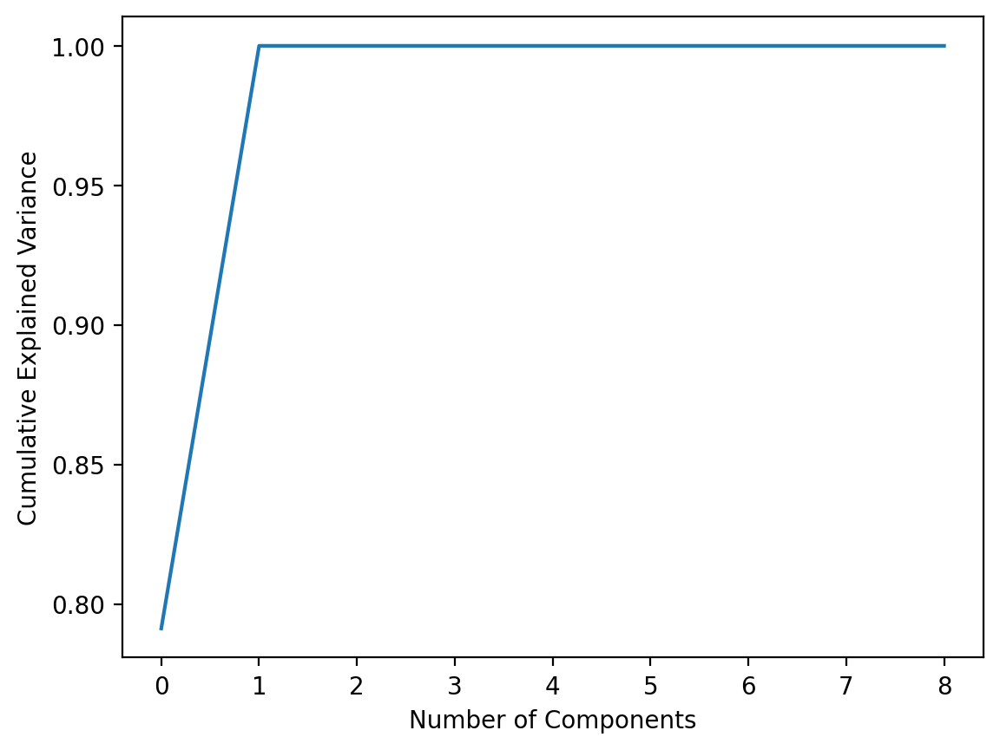

In [38]:
pca = PCA(random_state=RANDOM_STATE)
pca.fit(migration_data)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [39]:
migration_pipe = Pipeline(
    [
        ('ohe_migration_code',
         OneHotEncoder(drop='if_binary', sparse_output=False,
                       handle_unknown='infrequent_if_exist', min_frequency=0.1)),
        ('pca_migration_code',
         PCA(n_components=1, random_state=RANDOM_STATE))
    ]
)
migration_pipe.fit_transform(data[migration_code_cols])

array([[-1.12278868],
       [ 0.14316705],
       [-1.12278868],
       ...,
       [-1.12278868],
       [-1.12278868],
       [ 1.32623353]])

Let's move to `education` feature.

In [40]:
data.education.value_counts().index.values

array([' High school graduate', ' Children',
       ' Some college but no degree', ' Bachelors degree(BA AB BS)',
       ' 7th and 8th grade', ' 10th grade', ' 11th grade',
       ' Masters degree(MA MS MEng MEd MSW MBA)', ' 9th grade',
       ' Associates degree-occup /vocational',
       ' Associates degree-academic program', ' 5th or 6th grade',
       ' 12th grade no diploma', ' 1st 2nd 3rd or 4th grade',
       ' Prof school degree (MD DDS DVM LLB JD)',
       ' Doctorate degree(PhD EdD)', ' Less than 1st grade'], dtype=object)

In [41]:
education_list = [[
    ' Children',
    ' Less than 1st grade',
    ' 1st 2nd 3rd or 4th grade',
    ' 5th or 6th grade',
    ' 7th and 8th grade',
    ' 9th grade',
    ' 10th grade',
    ' 11th grade',
    ' 12th grade no diploma',
    ' High school graduate',
    ' Some college but no degree',
    ' Associates degree-occup /vocational',
    ' Associates degree-academic program',
    ' Bachelors degree(BA AB BS)',
    ' Masters degree(MA MS MEng MEd MSW MBA)',
    ' Prof school degree (MD DDS DVM LLB JD)',
    ' Doctorate degree(PhD EdD)',
]]

In [42]:
ord_enc = OrdinalEncoder(categories=education_list, handle_unknown='use_encoded_value', unknown_value=-1, encoded_missing_value=-1)
ord_enc.fit_transform(data[ordinal_cols])

array([[ 9.],
       [10.],
       [ 6.],
       ...,
       [10.],
       [ 6.],
       [ 9.]])

Let's move to columns from `ohe_cols` list.

In [43]:
ohe_main = OneHotEncoder(drop='if_binary', handle_unknown='infrequent_if_exist', min_frequency=.05)
ohe_main.fit_transform(data[ohe_cols]).toarray().shape

(196294, 11)

In [44]:
len(ohe_cols)

4

In [45]:
ohe_main.get_feature_names_out()

array(['sex_ Male', 'live in this house 1 year ago_ No',
       'live in this house 1 year ago_ Not in universe under 1 year old',
       'live in this house 1 year ago_ Yes',
       'migration prev res in sunbelt_ ?',
       'migration prev res in sunbelt_ No',
       'migration prev res in sunbelt_ Not in universe',
       'migration prev res in sunbelt_infrequent_sklearn',
       'own business or self employed_0',
       'own business or self employed_2',
       'own business or self employed_infrequent_sklearn'], dtype=object)

Let's move to features which in my opinion will be uninformative, I've provided explanation on the EDA step.

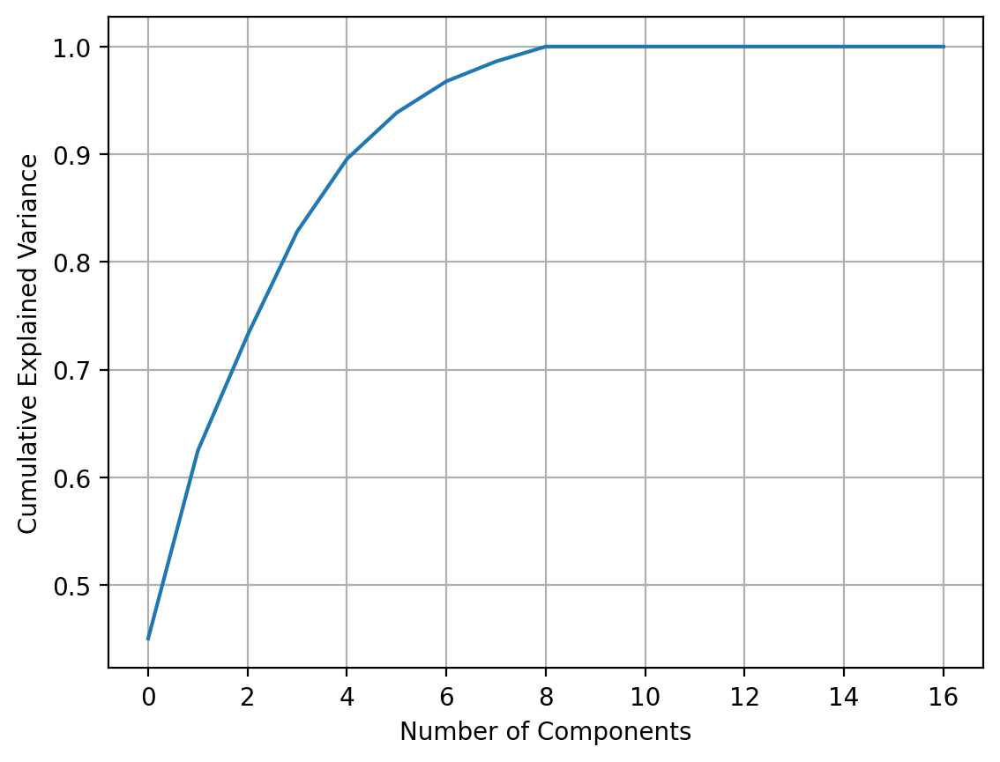

In [46]:
uninform_ohe = OneHotEncoder(handle_unknown='infrequent_if_exist',
                             sparse_output=False, min_frequency=0.05)
uninform_data = uninform_ohe.fit_transform(data[uninform_features])
pca = PCA(random_state=RANDOM_STATE)
pca.fit(uninform_data)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

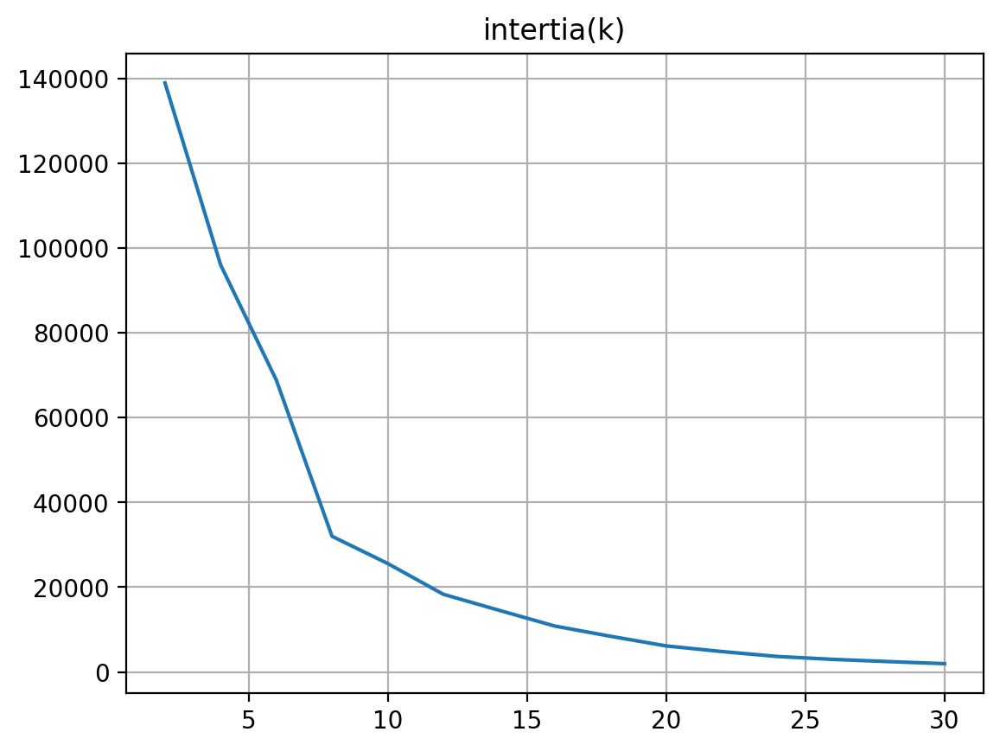

In [47]:
pca = PCA(n_components=6, random_state=RANDOM_STATE)
uninform_data_pca = pca.fit_transform(uninform_data)

inertia_values = []
k_values = []

for k in range(2, 31, 2):
    k_means = KMeans(n_clusters=k, n_init='auto', random_state=RANDOM_STATE)
    clusters = k_means.fit_predict(uninform_data_pca)
    inertia_values.append(k_means.inertia_)
    k_values.append(k)

plt.plot(k_values, inertia_values)
plt.title('intertia(k)')
plt.grid()
plt.show()

In [48]:
class KMeansClusterer(KMeans, TransformerMixin):
    def __init__(self, n_clusters):
        super().__init__(n_clusters=n_clusters, n_init='auto', random_state=RANDOM_STATE)

    def fit_transform(self, X, y=None):
        self.fit(X)
        return self.predict(X).reshape(-1, 1)
    
    def transform(self, X):
        return self.predict(X).reshape(-1, 1)

In [49]:
uninform_feat_pipe = Pipeline(
    [
        ('ohe_uninform_feat',
         OneHotEncoder(handle_unknown='infrequent_if_exist',
                             sparse_output=False, min_frequency=0.05)),
        ('pca_uninform_feat',
         PCA(n_components=6, random_state=RANDOM_STATE)),
        ('KMeans', KMeansClusterer(n_clusters=12))
    ]
)
uninform_feat_pipe.fit_transform(data[uninform_features])

array([[ 2],
       [ 7],
       [ 3],
       ...,
       [ 2],
       [11],
       [ 2]], dtype=int32)

Let's move on to coding the remaining categorical features from `target_enc_cols` list.

In [50]:
target_enc = TargetEncoder(target_type='binary', random_state=RANDOM_STATE)
target_enc.fit_transform(data[target_enc_cols], data.target).shape

(196294, 13)

In [51]:
num_features = ['age', 'wage per hour', 'num persons worked for employer', 'weeks worked in year']

In [52]:
drop_cols

['state of previous residence',
 'instance weight',
 'capital gains',
 'capital losses',
 'dividends from stocks']

In [53]:
main_column_transformer = ColumnTransformer(
    [
        ('pca_capital', pca_capital, continuous_outliers_feat),
        ('country_pipe', country_pipe, country_of_birth),
        ('migration_pipe', migration_pipe, migration_code_cols),
        ('edu_ordinal_enc', ord_enc, ordinal_cols),
        ('ohe', ohe_main, ohe_cols),
        ('cluster_uninform_feat', uninform_feat_pipe, uninform_features),
        ('target_enc', target_enc, target_enc_cols),
        #('drop', 'drop', drop_cols),
        ('scale', StandardScaler(), num_features)
    ],
    remainder='drop'
)

X = main_column_transformer.fit_transform(data.drop(columns='target'), data.target)
y = data.target.values

print(X.shape)
main_column_transformer

(196294, 36)


ColumnTransformer(transformers=[('pca_capital',
                                 PCA(n_components=1, random_state=42),
                                 ['capital gains', 'capital losses',
                                  'dividends from stocks']),
                                ('country_pipe',
                                 Pipeline(steps=[('ohe_country_of_birth',
                                                  OneHotEncoder(drop='if_binary',
                                                                handle_unknown='infrequent_if_exist',
                                                                min_frequency=0.03,
                                                                sparse_output=False)),
                                                 ('pca_country_of_birth',
                                                  PCA(n_components=4,
                                                      ran...
                                 ['class of worker', 'detailed industry recode',
                                  'detailed occupation recode', 'marital stat',
                                  'major industry code',
                                  'major occupation code', 'race',
                                  'member of a labor union',
                                  'full or part time employment stat',
                                  'tax filer stat', 'citizenship',
                                  'detailed household and family stat',
                                  'detailed household summary in household']),
                                ('scale', StandardScaler(),
                                 ['age', 'wage per hour',
                                  'num persons worked for employer',
                                  'weeks worked in year'])])

0 pca_capital__pca0
1 country_pipe__pca0
2 country_pipe__pca1
3 country_pipe__pca2
4 country_pipe__pca3
5 migration_pipe__pca0
6 edu_ordinal_enc__education
7 ohe__sex_ Male
8 ohe__live in this house 1 year ago_ No
9 ohe__live in this house 1 year ago_ Not in universe under 1 year old
10 ohe__live in this house 1 year ago_ Yes
11 ohe__migration prev res in sunbelt_ ?
12 ohe__migration prev res in sunbelt_ No
13 ohe__migration prev res in sunbelt_ Not in universe
14 ohe__migration prev res in sunbelt_infrequent_sklearn
15 ohe__own business or self employed_0
16 ohe__own business or self employed_2
17 ohe__own business or self employed_infrequent_sklearn
18 cluster_uninform_feat__kmeansclusterer0
19 target_enc__class of worker
20 target_enc__detailed industry recode
21 target_enc__detailed occupation recode
22 target_enc__marital stat
23 target_enc__major industry code
24 target_enc__major occupation code
25 target_enc__race
26 target_enc__member of a labor union
27 target_enc__full or pa

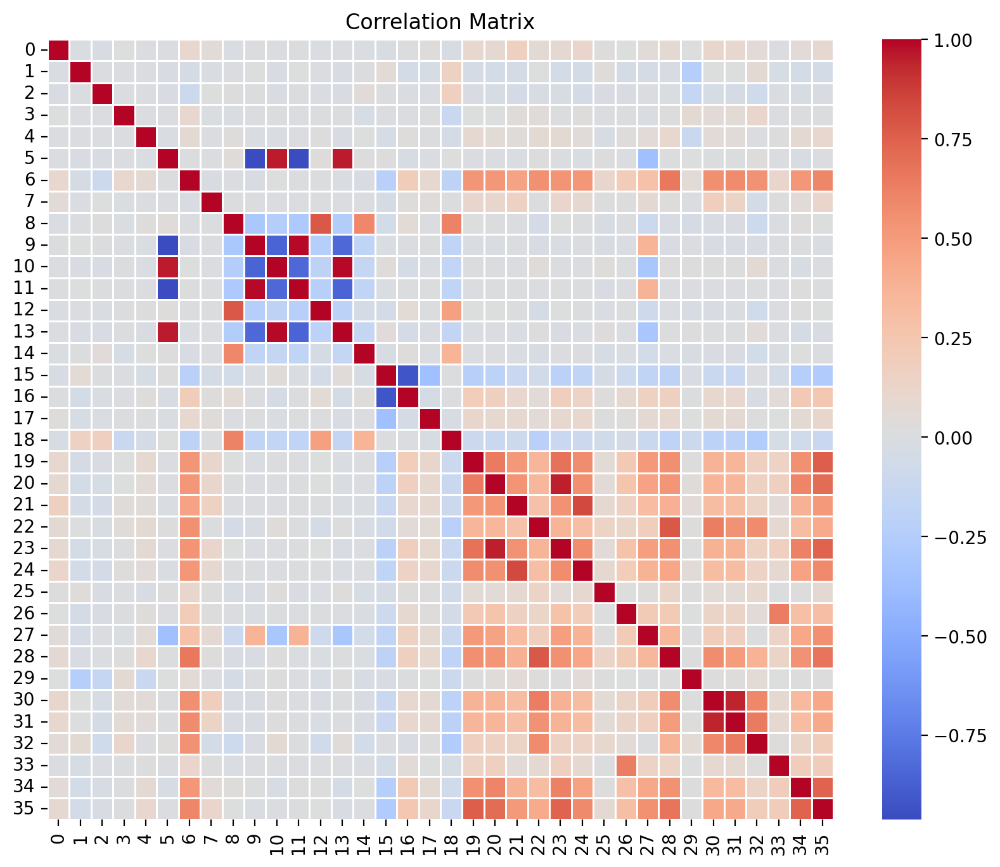

In [54]:
corr_matrix = np.corrcoef(X, rowvar=False)
features_names = list(main_column_transformer.get_feature_names_out())
features_names = features_names[0:19] + features_names[30:]  # as a result of changing behavior of KMeans
feature_types = []
for i, feature in enumerate(features_names):
    feature_types.append('c' if 5 < i < 19 else 'q')
    print(i, feature)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

### Preporcessing summary

1. We converted the target to a binary variable (1, 0).
2. Duplicates and feature `instance weight` were dropped.
3. Capital related features with rather unusual values were transformed using the 1st component of PCA.
4. Categorical features related to country of birth with a dominant class (~80%) of United-States were transformed via one hot encoding and PCA.
5. Categorical features related to migration code were transformed via one hot encoding and PCA.
6. `education` feature was encoded using ordinal encoding.
7. Categorical features with small number of classes were encoded using one hot encoding.
8. Features with poor information about target were encoded via one hot encoding, then transformed via PCA and KMeans.
9. Other categorical features were encoded using target encoding.
10. Numerical features were scaled by StandardScaler.

Thus, we have ColumnTransformer object with all preprocessing steps.

## 3. Model training

3.1. Apply different techniques which can help to work with imbalanced data. You are supposed to try at least 2 techniques (in the end, you don't have to include them into your final pipeline - but you should explain why)

We will try 2 techiques, but we will aply them after choosing model:
1. Undersampling via NearMiss.
2. Oversampling via BorderlineSMOTE

In [55]:
nmiss = NearMiss(version=1, sampling_strategy=0.2, n_neighbors=3)
bsmote = BorderlineSMOTE(kind='borderline-1', sampling_strategy=0.8, random_state=RANDOM_STATE)

In [56]:
X_undersamp, y_undersamp = nmiss.fit_resample(X, y)
X_oversamp, y_oversamp = bsmote.fit_resample(X, y)

In [57]:
X.shape, y.shape

((196294, 36), (196294,))

In [58]:
np.round((y == 0).sum() / (y == 1).sum(), 4)

14.8532

In [59]:
X_undersamp.shape, y_undersamp.shape

((74292, 36), (74292,))

In [60]:
np.round((y_undersamp == 0).sum() / (y_undersamp == 1).sum(), 4)

5.0

In [61]:
X_oversamp.shape, y_oversamp.shape

((331041, 36), (331041,))

In [62]:
np.round((y_oversamp == 0).sum() / (y_oversamp == 1).sum(), 4)

1.25

3.2. Train different machine learning models, including the advanced boosting algorithms studied during the course. Carefully tune hyperparameters of the algorithms. You are supposed to compare at least 3 models

We will try 3 boostings:
- XGBoost
- LGBM
- CatBoost

In [63]:
def random_search(est, params, X, y, n_iter=20):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
    scorer = make_scorer(fbeta_score, beta=2)
    
    print('Starting RandomizedSearchCV')
    rs = RandomizedSearchCV(est, params, n_iter=n_iter, scoring=scorer, cv=skf, n_jobs=1, verbose=1, random_state=RANDOM_STATE)
    rs.fit(X, y)
    print('Finished search\n')

    print('Evaluating search results\n')
    est.fit(X, y)
    y_pred = est.predict(X)
    print('Base f_beta:', np.round(fbeta_score(y_true=y, y_pred=y_pred, beta=2), 4))
    print('Base recall:', np.round(recall_score(y_true=y, y_pred=y_pred), 4))
    print('Base precision:', np.round(precision_score(y_true=y, y_pred=y_pred), 4))
    
    best_est = rs.best_estimator_
    best_est.fit(X, y)
    y_pred = best_est.predict(X)
    # print(rs.best_params_)
    print('Tuned f_beta:', np.round(fbeta_score(y_true=y, y_pred=y_pred, beta=2), 4))
    print('Tuned recall:', np.round(recall_score(y_true=y, y_pred=y_pred), 4))
    print('Tuned precision:', np.round(precision_score(y_true=y, y_pred=y_pred), 4))
    print('----------------')
    
    return rs

In [64]:
def eval_model_quality(est, X, y):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
    fbetas, precs, recalls = [], [], []
    for train, val in skf.split(X, y):
        est.fit(X[train], y[train])
        y_pred = est.predict(X[val])
        fbeta = fbeta_score(y_true=y[val], y_pred=y_pred, beta=2)
        prec = precision_score(y_true=y[val], y_pred=y_pred)
        recall = recall_score(y_true=y[val], y_pred=y_pred)
        print(np.round(fbeta, 5), np.round(prec, 5), np.round(recall, 5))

        fbetas.append(fbeta)
        precs.append(prec)
        recalls.append(recall)
    fbeta = np.round(np.mean(fbetas), 4)
    prec = np.round(np.mean(precs), 4)
    recall = np.round(np.mean(recalls), 4)
    
    print(f'F_beta:', fbeta)
    print(f'Precision:', prec)
    print(f'Recall:', recall)

    return fbeta, prec, recall

In [65]:
def train(est, params_list, X, y, search=False, search_params=None, n_iter=20):
    class_weights = (y == 0).sum() / (y == 1).sum()
    est.set_params(scale_pos_weight=class_weights)
    
    if search and search_params:
        cv_est = deepcopy(est)
        rs = random_search(cv_est, search_params, X, y, n_iter=n_iter)
        print('Best score after search:', rs.best_score_)
        params_list.append(rs.best_params_)
    
    best_params = {}
    best_scores = 0, 0, 0
    best_est = None
    print('Starting models evaluation')
    for i, params in enumerate(params_list):
        check_est = deepcopy(est)
        check_est.set_params(**params)
        print(f'{i} model')
        scores = eval_model_quality(check_est, X, y)
        if scores[0] > best_scores[0]:
            best_params = params
            best_scores = scores
            best_est = check_est
        print('------------')
    print(f'Best scores: {best_scores}')
    # print(f'Best params: {best_params}')
    return best_est, best_params, best_scores

In [66]:
xgb = XGBClassifier(
    objective='binary:logistic',
    # enable_categorical=True,
    # feature_types=feature_types,
    n_jobs=10,
    verbosity=1,
    random_state=RANDOM_STATE
)

xgb_random_params = {
    # 'tree_method': ['hist', 'approx'],
    # 'eval_metric': ['aucpr', 'logloss'],
    'learning_rate': scs.loguniform(10**-3, 0.6),
    'grow_policy': ['depthwise', 'lossguide'],
    'n_estimators': range(75, 301, 75),
    'max_leaves': [0, 8, 16, 24, 32, 64],
    'max_depth': range(3, 10, 2),
    'gamma': [0, 0.5, 1., 2., 4.],
    'subsample': scs.uniform(0.6, 0.4),
    'colsample_bytree': scs.uniform(0.6, 0.4),
    'colsample_bylevel': scs.uniform(0.6, 0.4),
    'colsample_bynode': scs.uniform(0.6, 0.4),
    'lambda': [0, 0.1, 0.5, 1., 1.5, 2., 4.],
    'alpha': [0, 0.1, 0.5, 1., 1.5, 2., 4.],
    'max_bin': [256, 512]  # [128, 256, 512]
}

In [67]:
# xgb_params1 = { # fbeta 0.658
#     'alpha': 2.0,
#     'colsample_bylevel': 0.973746805907606,
#     'colsample_bynode': 0.9702274051627106,
#     'colsample_bytree': 0.7803357485616529,
#     'eval_metric': 'logloss',
#     'gamma': 0,
#     'grow_policy': 'depthwise',
#     'lambda': 0.1,
#     'learning_rate': 0.15649138428458495,
#     'max_bin': 256,
#     'max_depth': 7,
#     'max_leaves': 0,
#     'subsample': 0.9349481810310641,
#     'tree_method': 'hist'
# }

xgb_params2 = {  # fbeta 0.663
    'alpha': 4.0,
    'colsample_bylevel': 0.6592403194508509,
    'colsample_bynode': 0.8985255250276307,
    'colsample_bytree': 0.6033418816688554,
    'eval_metric': 'logloss',
    'gamma': 2.0,
    'grow_policy': 'depthwise',
    'lambda': 1.0,
    'learning_rate': 0.0720361092655816,
    'max_bin': 512,
    'max_depth': 9,
    'max_leaves': 0,
    'n_estimators': 300,
    'subsample': 0.7484424364398156,
    'tree_method': 'approx'
}

xgb_params3 = {  # fbeta 0.6601
    'alpha': 0.5,
    'colsample_bylevel': 0.7507656658945487,
    'colsample_bynode': 0.7846931254449528,
    'colsample_bytree': 0.7923624003012278,
    'eval_metric': 'aucpr',
    'gamma': 0.5,
    'grow_policy': 'lossguide',
    'lambda': 1.5,
    'learning_rate': 0.06669235153300923,
    'max_bin': 256,
    'max_depth': 9,
    'max_leaves': 64,
    'n_estimators': 225,
    'subsample': 0.9615653321041499,
    'tree_method': 'hist'
}

xgb_params_list = [xgb_params2, xgb_params3]

In [68]:
u_xgb_params1 = {'alpha': 1.5,  # fbeta 0.7652
  'colsample_bylevel': 0.9129541936233094,
  'colsample_bynode': 0.8268065043946671,
  'colsample_bytree': 0.8953796837005306,
  'gamma': 2.0,
  'grow_policy': 'lossguide',
  'lambda': 1.5,
  'learning_rate': 0.13360292216787514,
  'max_bin': 512,
  'max_depth': 5,
  'max_leaves': 16,
  'n_estimators': 150,
  'subsample': 0.9605502598353777}

u_xgb_params2 = {'alpha': 1.0,  # fbeta 0.7662
 'colsample_bylevel': 0.9297798435621953,
 'colsample_bynode': 0.6756045918057724,
 'colsample_bytree': 0.9582811314531029,
 'gamma': 4.0,
 'grow_policy': 'depthwise',
 'lambda': 2.0,
 'learning_rate': 0.06279569102238816,
 'max_bin': 512,
 'max_depth': 9,
 'max_leaves': 24,
 'n_estimators': 300,
 'subsample': 0.8053401626427601}

o_xgb_params1 = {'alpha': 1.0,  # fbeta 0.8917
 'colsample_bylevel': 0.6437875440217815,
 'colsample_bynode': 0.957791972387227,
 'colsample_bytree': 0.9965901340580192,
 'gamma': 0.5,
 'grow_policy': 'lossguide',
 'lambda': 1.5,
 'learning_rate': 0.021634267769819426,
 'max_bin': 256,
 'max_depth': 7,
 'max_leaves': 8,
 'n_estimators': 225,
 'subsample': 0.7391236831608772}

o_xgb_params2 = {'alpha': 1.5,  # fbeta 0.9627
 'colsample_bylevel': 0.9868724854588103,
 'colsample_bynode': 0.8058627016540217,
 'colsample_bytree': 0.9746718081012999,
 'gamma': 0,
 'grow_policy': 'lossguide',
 'lambda': 1.0,
 'learning_rate': 0.4283275395873058,
 'max_bin': 256,
 'max_depth': 9,
 'max_leaves': 0,
 'n_estimators': 75,
 'subsample': 0.988832213643838}

In [69]:
start = time()
best_xgb, xgb_params, xgb_scores = train(
    xgb, xgb_params_list,
    X, y,
    search=True, search_params=xgb_random_params, n_iter=20
)
print('********************\n')
best_u_xgb, u_xgb_params, u_xgb_scores = train(
    xgb, [u_xgb_params1, u_xgb_params2],
    X_undersamp, y_undersamp,
    search=True, search_params=xgb_random_params, n_iter=20
)
print('********************\n')
best_o_xgb, o_xgb_params, o_xgb_scores = train(
    xgb, [o_xgb_params1, o_xgb_params2],
    X_oversamp, y_oversamp,
    search=True, search_params=xgb_random_params, n_iter=20
)
print(f'Time spent {(time() - start) // 60} minutes')

Starting RandomizedSearchCV
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Finished search

Evaluating search results

Base f_beta: 0.7143
Base recall: 0.9392
Base precision: 0.3648
Tuned f_beta: 0.6896
Tuned recall: 0.9251
Tuned precision: 0.3417
----------------
Best score after search: 0.6539856535721461
Starting models evaluation
0 model
0.67857 0.39449 0.82754
0.65767 0.42734 0.7601
0.66099 0.39095 0.79895
0.66089 0.38292 0.80743
0.66544 0.4081 0.78998
F_beta: 0.6647
Precision: 0.4008
Recall: 0.7968
------------
1 model
0.66743 0.34484 0.87116
0.65024 0.37316 0.79847
0.65747 0.33712 0.86233
0.65264 0.33203 0.86031
0.66142 0.35115 0.84895
F_beta: 0.6578
Precision: 0.3477
Recall: 0.8482
------------
2 model
0.66069 0.3266 0.88772
0.6522 0.3536 0.82674
0.65038 0.31861 0.87929
0.64849 0.32084 0.87081
0.65816 0.33658 0.8647
F_beta: 0.654
Precision: 0.3312
Recall: 0.8659
------------
Best scores: (0.6647, 0.4008, 0.7968)
********************

Starting RandomizedSearchCV
F

In [70]:
lgbm = LGBMClassifier(
    objective='binary',
    n_jobs=10,
    verbose=-1,
    random_state=RANDOM_STATE
)

lgbm_random_params = {
    'n_estimators': range(75, 301, 75),
    'learning_rate': scs.loguniform(10**-3, 0.7),
    'max_depth': [-1, 3, 7, 9, 11],
    'num_leaves': [7, 15, 31, 50, 63],
    'reg_alpha': [0, 0.1, 0.5, 1., 1.5, 2., 4.],
    'reg_lambda': [0, 0.1, 0.5, 1., 1.5, 2., 4.],
    'min_child_samples': [20, 50, 70, 100, 150],
    'min_child_weight': [1e-3, 1e-2, 1e-1, 1, 10],
    'subsample': scs.uniform(0.6, 0.4),
    'colsample_bytree': scs.uniform(0.6, 0.4),
    'min_split_gain': [0, 1e-3, 1e-2, 1e-1],
    'max_bin': [127, 255, 511]
}

In [71]:
lgbm_params1 = {  # fbeta 0.6618
    'colsample_bytree': 0.7342436976963606,
    'learning_rate': 0.11492813693187798,
    'max_bin': 511,
    'max_depth': 11,
    'min_child_samples': 100,
    'min_child_weight': 0.01,
    'min_split_gain': 0.1,
    'n_estimators': 225,
    'num_leaves': 50,
    'reg_alpha': 0.5,
    'reg_lambda': 0.5,
    'subsample': 0.7132002541716311
}

# lgbm_params2 = {  # fbeta 0.6609
#     'colsample_bytree': 0.7331263143649938,
#     'learning_rate': 0.08359812699494727,
#     'max_bin': 255,
#     'max_depth': 9,
#     'min_child_samples': 70,
#     'min_child_weight': 10,
#     'min_split_gain': 0,
#     'n_estimators': 300,
#     'num_leaves': 63,
#     'reg_alpha': 4.0,
#     'reg_lambda': 0.5,
#     'subsample': 0.9154388844898123
# }

lgbm_params3 = {  # fbeta 0.6631
    'colsample_bytree': 0.6672056830979454,
    'learning_rate': 0.12487573213739103,
    'max_bin': 255,
    'max_depth': -1,
    'min_child_samples': 150,
    'min_child_weight': 0.001,
    'min_split_gain': 0.001,
    'n_estimators': 300,
    'num_leaves': 63,
    'reg_alpha': 4.0,
    'reg_lambda': 0.5,
    'subsample': 0.8428376144355123}

lgbm_params_list = [lgbm_params1, lgbm_params3]

In [72]:
u_lgbm_params1 = { # fbeta 0.7686
    'colsample_bytree': 0.6914571222013851,
    'learning_rate': 0.08148061544421419,
    'max_bin': 255,
    'max_depth': 9,
    'min_child_samples': 50,
    'min_child_weight': 0.01,
    'min_split_gain': 0.001,
    'n_estimators': 150,
    'num_leaves': 31,
    'reg_alpha': 0.5,
    'reg_lambda': 0.1,
    'subsample': 0.940872600127416
}
o_lgbm_params1 = {  # fbeta 0.9624
    'colsample_bytree': 0.7113422699389556,
    'learning_rate': 0.06810480471837455,
    'max_bin': 255,
    'max_depth': 11,
    'min_child_samples': 70,
    'min_child_weight': 1,
    'min_split_gain': 0.001,
    'n_estimators': 225,
    'num_leaves': 50,
    'reg_alpha': 0.1,
    'reg_lambda': 1.5,
    'subsample': 0.9252350153707033}


In [73]:
start = time()
best_lgbm, lgbm_params, lgbm_scores = train(
    lgbm, lgbm_params_list,
    X, y,
    search=True, search_params=lgbm_random_params, n_iter=20
)
print('********************\n')
best_u_lgbm, u_lgbm_params, u_lgbm_scores = train(
    lgbm, [u_lgbm_params1],
    X_undersamp, y_undersamp,
    search=True, search_params=lgbm_random_params, n_iter=20
)
print('********************\n')
best_o_lgbm, o_lgbm_params, o_lgbm_scores = train(
    lgbm, [o_lgbm_params1],
    X_oversamp, y_oversamp,
    search=True, search_params=lgbm_random_params, n_iter=20
)
print(f'Time spent {(time() - start) // 60} minutes')

Starting RandomizedSearchCV
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Finished search

Evaluating search results

Base f_beta: 0.6671
Base recall: 0.9171
Base precision: 0.3191
Tuned f_beta: 0.6977
Tuned recall: 0.9364
Tuned precision: 0.3454
----------------
Best score after search: 0.6544155627269239
Starting models evaluation
0 model
0.66947 0.34861 0.86955
0.66312 0.35216 0.85097
0.65911 0.34309 0.85628
0.65916 0.34343 0.85587
0.66353 0.35442 0.84855
F_beta: 0.6629
Precision: 0.3483
Recall: 0.8562
------------
1 model
0.67282 0.37328 0.84168
0.67175 0.38251 0.82835
0.66329 0.36745 0.83044
0.65909 0.36638 0.82358
0.66684 0.38753 0.81341
F_beta: 0.6668
Precision: 0.3754
Recall: 0.8275
------------
2 model
0.66205 0.33071 0.88328
0.66 0.33509 0.87116
0.64988 0.32366 0.86879
0.64544 0.31843 0.86839
0.65472 0.33307 0.86309
F_beta: 0.6544
Precision: 0.3282
Recall: 0.8709
------------
Best scores: (0.6668, 0.3754, 0.8275)
********************

Starting RandomizedSearch

In [74]:
cat = CatBoostClassifier(verbose=0, thread_count=10, random_state=RANDOM_STATE)
cat_random_params = {
    'learning_rate': scs.loguniform(10**-3, 0.7),
    'depth': range(4, 11, 2),
    'l2_leaf_reg': [1, 3, 5, 7, 9],
    'subsample': scs.uniform(0.6, 0.4),
    'colsample_bylevel': scs.uniform(0.6, 0.4),
    'iterations': [100, 200, 300],
    # 'border_count': [32, 64, 128],
    'random_strength': [0.1, 0.5, 1.0],
    'bagging_temperature': [0.5, 1.0, 1.5],
    'min_data_in_leaf': [1, 5, 10],
    'max_bin': [128, 256, 512],
    'grow_policy': ['SymmetricTree', 'Depthwise', 'Lossguide']
}

In [75]:
# cat_params1 = {
#     'bagging_temperature': 1.5,
#     'colsample_bylevel': 0.756983274491792,
#     'depth': 4,
#     'grow_policy': 'Depthwise',
#     'iterations': 300,
#     'l2_leaf_reg': 5,
#     'learning_rate': 0.6363768579611538,
#     'max_bin': 512,
#     'min_data_in_leaf': 5,
#     'random_strength': 0.5,
#     'subsample': 0.8488158249483975
# }

cat_params2 = {
    'bagging_temperature': 0.5,
    'colsample_bylevel': 0.8735855077592565, 
    'depth': 10,
    'grow_policy': 'Lossguide',
    'iterations': 200,
    'l2_leaf_reg': 1,
    'learning_rate': 0.29430370821009216,
    'max_bin': 512,
    'min_data_in_leaf': 5,
    'random_strength': 1.0,
    'subsample': 0.8573152873769412
}

cat_params3 = {
    'bagging_temperature': 1.0,
    'colsample_bylevel': 0.6943939678995823,
    'depth': 6,
    'grow_policy': 'Lossguide',
    'iterations': 300,
    'l2_leaf_reg': 1,
    'learning_rate': 0.06960678239135189,
    'max_bin': 256,
    'min_data_in_leaf': 5,
    'random_strength': 0.1,
    'subsample': 0.6806876809341584
}

cat_params4 = {  # fbeta 0.661
    'bagging_temperature': 0.5,
    'colsample_bylevel': 0.679486272613669,
    'depth': 10,
    'grow_policy': 'Lossguide',
    'iterations': 300,
    'l2_leaf_reg': 5,
    'learning_rate': 0.10258371992598908,
    'max_bin': 512,
    'min_data_in_leaf': 10,
    'random_strength': 0.1,
    'subsample': 0.8423839899124046
}

cat_params_list = [cat_params2, cat_params3, cat_params4]

In [76]:
u_cat_params1 = {'bagging_temperature': 1.5,  # fbeta 0.7664
 'colsample_bylevel': 0.6658623412571767,
 'depth': 8,
 'grow_policy': 'SymmetricTree',
 'iterations': 200,
 'l2_leaf_reg': 9,
 'learning_rate': 0.09333583132532705,
 'max_bin': 256,
 'min_data_in_leaf': 10,
 'random_strength': 1.0,
 'subsample': 0.7292811728083021}

o_cat_params1 = {'bagging_temperature': 1.5,  # fbeta 0.9625
 'colsample_bylevel': 0.8733054075301833,
 'depth': 10,
 'grow_policy': 'SymmetricTree',
 'iterations': 300,
 'l2_leaf_reg': 5,
 'learning_rate': 0.38646101813995626,
 'max_bin': 256,
 'min_data_in_leaf': 5,
 'random_strength': 0.5,
 'subsample': 0.8080272084711243}

In [77]:
start = time()
best_cat, cat_params, cat_scores = train(
    cat, cat_params_list,
    X, y,
    search=True, search_params=cat_random_params, n_iter=10  # too slow
)
print('********************\n')
best_u_cat, u_cat_params, u_cat_scores = train(
    cat, [u_cat_params1],
    X_undersamp, y_undersamp,
    search=True, search_params=cat_random_params, n_iter=10
)
print('********************\n')
best_o_cat, o_cat_params, o_cat_scores = train(
    cat, [o_cat_params1],
    X_oversamp, y_oversamp,
    search=True, search_params=cat_random_params, n_iter=10
)
print(f'Time spent {(time() - start) // 60} minutes')

Starting RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Finished search

Evaluating search results

Base f_beta: 0.7419
Base recall: 0.9553
Base precision: 0.3919
Tuned f_beta: 0.7202
Tuned recall: 0.9418
Tuned precision: 0.3711
----------------
Best score after search: 0.6633250968457409
Starting models evaluation
0 model
0.63971 0.44528 0.71809
0.64351 0.36362 0.79685
0.63573 0.33537 0.81914
0.62799 0.3266 0.81631
0.63896 0.37842 0.77181
F_beta: 0.6372
Precision: 0.3699
Recall: 0.7844
------------
1 model
0.67043 0.39711 0.80977
0.65457 0.37675 0.8025
0.64835 0.36524 0.8042
0.63806 0.37002 0.77917
0.64504 0.36954 0.79281
F_beta: 0.6513
Precision: 0.3757
Recall: 0.7977
------------
2 model
0.67029 0.34216 0.88166
0.65804 0.33642 0.8647
0.65228 0.32943 0.86395
0.65011 0.32831 0.86112
0.65257 0.33271 0.85905
F_beta: 0.6567
Precision: 0.3338
Recall: 0.8661
------------
3 model
0.674 0.35536 0.86874
0.66465 0.34886 0.85905
0.66118 0.34805 0.85305
0.65704 0

In [78]:
models_cv_results = pd.DataFrame(
    {
        'XGB': xgb_scores,
        'LGBM': lgbm_scores,
        'Cat': cat_scores,
        'XGB_undersamp': u_xgb_scores,
        'LGBM_undersamp': u_lgbm_scores,
        'Cat_undersamp': u_cat_scores,
        'XGB_oversamp': o_xgb_scores,
        'LGBM_oversamp': o_lgbm_scores,
        'Cat_oversamp': o_cat_scores,
    },
    index=['F-beta', 'Precision', 'Recall'])
models_cv_results.T.sort_values('F-beta', ascending=False)

,F-beta,Precision,Recall
LGBM_oversamp,0.8813,0.6836,0.9512
XGB_oversamp,0.8736,0.6591,0.9523
Cat_oversamp,0.8660,0.6749,0.9413
LGBM_undersamp,0.7689,0.5727,0.8409
XGB_undersamp,0.7668,0.5729,0.8377
Cat_undersamp,0.7668,0.5979,0.8251
LGBM,0.6668,0.3754,0.8275
XGB,0.6647,0.4008,0.7968
Cat,0.6633,0.3484,0.8571


We see that all models fitted on the same data show almost the same F-beta score. And the best results show models fitted on oversampled data.<br>
We can stop training our models at this point, realizing that we have ways to improve the results of all models through deeper data analysis and better hyperparameters tuning.

3.3. Perform blending or stacking of the trained machine learning algorithms. Carefully tune the weights of the ensemble

In [79]:
class EnsembleBoostings:
    def __init__(self, xgb_fitted, lgbm_fitted, cat_fitted):
        self.xgb = xgb_fitted
        self.lgbm = lgbm_fitted
        self.cat = cat_fitted

    def fit(self, X, y):
        y_xgb = self.xgb.predict_proba(X)
        y_lgbm = self.lgbm.predict_proba(X)
        y_cal = self.cat.predict_proba(X)
        
        cat_weights = np.linspace(0, 1, 101)
        lgbm_weights = np.linspace(0, 1, 101)
        
        best_score = np.inf
        self.weights = np.ones(3) / 3
        for w_c in cat_weights:
            for w_l in lgbm_weights:
                w_x = np.round(1. - w_c - w_l, 2)
                if w_x < 0.:
                    continue
                assert np.round((w_x + w_l + w_c), 2) == 1., f'{w_x}, {w_l}, {w_c}'
                y_prob_ensemble = (
                    w_x * y_xgb[:, 1] + 
                    w_l * y_lgbm[:, 1] + 
                    w_c * y_cal[:, 1]
                )
                y_pred_ensemble = (y_prob_ensemble > 0.5).astype(int)
                score = - fbeta_score(y, y_pred_ensemble, beta=2)
                if score < best_score:
                    self.weights = [w_x, w_l, w_c]
                    best_score = score
        print(f'Fitted weights: {self.weights}. Best score: {- np.round(best_score, 4)}')

    def predict(self, X):
        y_xgb = self.xgb.predict_proba(X)
        y_lgbm = self.lgbm.predict_proba(X)
        y_cal = self.cat.predict_proba(X)

        w_x, w_l, w_c = self.weights
        y_prob_ensemble = (
            w_x * y_xgb[:, 1] + 
            w_l * y_lgbm[:, 1] + 
            w_c * y_cal[:, 1]
        )
        y_pred_ensemble = (y_prob_ensemble > 0.5).astype(int)
        return y_pred_ensemble

In [80]:
ens = EnsembleBoostings(best_xgb, best_lgbm, best_cat)
ens.fit(X, y)

y_pred = ens.predict(X)
ens_fbeta = fbeta_score(y_true=y, y_pred=y_pred, beta=2)
ens_precision = precision_score(y_true=y, y_pred=y_pred)
ens_recall = recall_score(y_true=y, y_pred=y_pred)

Fitted weights: [0.69, 0.31, 0.0]. Best score: 0.7732


In [81]:
u_ens = EnsembleBoostings(best_u_xgb, best_u_lgbm, best_u_cat)
u_ens.fit(X_undersamp, y_undersamp)

y_pred = u_ens.predict(X_undersamp)
u_ens_fbeta = fbeta_score(y_true=y_undersamp, y_pred=y_pred, beta=2)
u_ens_precision = precision_score(y_true=y_undersamp, y_pred=y_pred)
u_ens_recall = recall_score(y_true=y_undersamp, y_pred=y_pred)

Fitted weights: [0.0, 0.0, 1.0]. Best score: 0.8271


In [82]:
o_ens = EnsembleBoostings(best_u_xgb, best_u_lgbm, best_u_cat)
o_ens.fit(X_oversamp, y_oversamp)

y_pred = o_ens.predict(X_oversamp)
o_ens_fbeta = fbeta_score(y_true=y_oversamp, y_pred=y_pred, beta=2)
o_ens_precision = precision_score(y_true=y_oversamp, y_pred=y_pred)
o_ens_recall = recall_score(y_true=y_oversamp, y_pred=y_pred)

Fitted weights: [0.1, 0.74, 0.16]. Best score: 0.8247


In [83]:
models_cv_results['Ensemble'] = [ens_fbeta, ens_precision, ens_recall]
models_cv_results['Ensemble_undersamp'] = [u_ens_fbeta, u_ens_precision, u_ens_recall]
models_cv_results['Ensemble_oversamp'] = [o_ens_fbeta, o_ens_precision, o_ens_recall]
models_cv_results.T.sort_values('F-beta', ascending=False)

,F-beta,Precision,Recall
LGBM_oversamp,0.881300,0.683600,0.951200
XGB_oversamp,0.873600,0.659100,0.952300
Cat_oversamp,0.866000,0.674900,0.941300
Ensemble_undersamp,0.827073,0.642703,0.890971
Ensemble_oversamp,0.824712,0.698333,0.863793
Ensemble,0.773241,0.446502,0.946374
LGBM_undersamp,0.768900,0.572700,0.840900
XGB_undersamp,0.766800,0.572900,0.837700
Cat_undersamp,0.766800,0.597900,0.825100
LGBM,0.666800,0.375400,0.827500


## 4. Summary

4.1. Estimate the quality of the models and their ensemble on the test set. Describe the results. Which model is the best?

In [84]:
test['target'] = (test.income == ' 50000+.').astype(int)
test.drop(columns='income', inplace=True)
X_test = main_column_transformer.transform(test.drop(columns='target'))
y_test = test.target.values

print(X_test.shape)

(99762, 36)


In [85]:
def test_scores(est):
    y_pred = est.predict(X_test)
    f_beta = fbeta_score(y_true=y_test, y_pred=y_pred, beta=2)
    recall = recall_score(y_true=y_test, y_pred=y_pred)
    prec = precision_score(y_true=y_test, y_pred=y_pred)
    return f_beta, recall, prec

In [86]:
xgb_scores_test = test_scores(best_xgb)
u_xgb_scores_test = test_scores(best_u_xgb)
o_xgb_scores_test = test_scores(best_o_xgb)

lgbm_scores_test = test_scores(best_lgbm)
u_lgbm_scores_test = test_scores(best_u_lgbm)
o_lgbm_scores_test = test_scores(best_o_lgbm)

cat_scores_test = test_scores(best_cat)
u_cat_scores_test = test_scores(best_u_cat)
o_cat_scores_test = test_scores(best_o_cat)

ens_scores_test = test_scores(ens)
u_ens_scores_test = test_scores(u_ens)
o_ens_scores_test = test_scores(o_ens)

test_scores_df = pd.DataFrame(
    {
        'XGB': xgb_scores_test,
        'LGBM': lgbm_scores_test,
        'Cat': cat_scores_test,
        'XGB_undersamp': u_xgb_scores_test,
        'LGBM_undersamp': u_lgbm_scores_test,
        'Cat_undersamp': u_cat_scores_test,
        'XGB_oversamp': o_xgb_scores_test,
        'LGBM_oversamp': o_lgbm_scores_test,
        'Cat_oversamp': o_cat_scores_test,
        'Ensemble': ens_scores_test,
        'Ensemble_undersamp': u_ens_scores_test,
        'Ensemble_oversamp': o_ens_scores_test
    },
    index=['F-beta', 'Recall', 'Precision']
)
test_scores_df.T.sort_values(by='F-beta', ascending=False)

,F-beta,Recall,Precision
Ensemble,0.678210,0.831393,0.390449
XGB,0.677392,0.824281,0.395486
LGBM,0.673079,0.847236,0.369371
Cat,0.668385,0.867928,0.348184
XGB_oversamp,0.576103,0.908018,0.233983
Cat_oversamp,0.568563,0.826705,0.252805
LGBM_oversamp,0.553412,0.918041,0.213778
Cat_undersamp,0.459283,0.833495,0.164272
Ensemble_undersamp,0.459283,0.833495,0.164272
Ensemble_oversamp,0.447602,0.864048,0.152876


4.2. Interpret the best single model and the ensemble. Use at least 2 model interpretation techniques. Explain, why your models have good quality (or bad quality)

In [87]:
xgb_feat_imp = pd.DataFrame(data=best_xgb.feature_importances_, index=features_names, columns=['feature_importance'])
xgb_feat_imp.sort_values('feature_importance', ascending=False).head(10)

,feature_importance
target_enc__major occupation code,0.123796
edu_ordinal_enc__education,0.094339
scale__weeks worked in year,0.092386
ohe__sex_ Male,0.089510
pca_capital__pca0,0.056848
target_enc__detailed occupation recode,0.051424
target_enc__tax filer stat,0.050769
scale__num persons worked for employer,0.041835
scale__age,0.031626
target_enc__detailed household and family stat,0.027735


The feature `major occupation code` is the most important, and this can be explained by the fact that a person's occupation definitely affects income. Also `education` and `weeks worked in year` seems quite logical.

[13:22:52] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


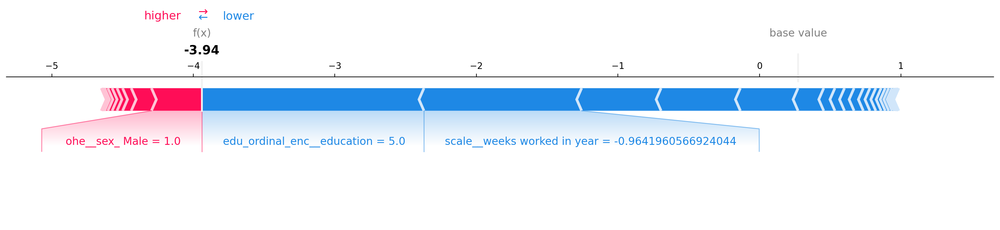

In [88]:
shap_exp = shap.TreeExplainer(best_xgb)
shap_values = shap_exp.shap_values(X_test, y_test)
shap.force_plot(base_value=shap_exp.expected_value, shap_values=shap_values[-1], features=X_test[-1], feature_names=features_names, matplotlib=True)

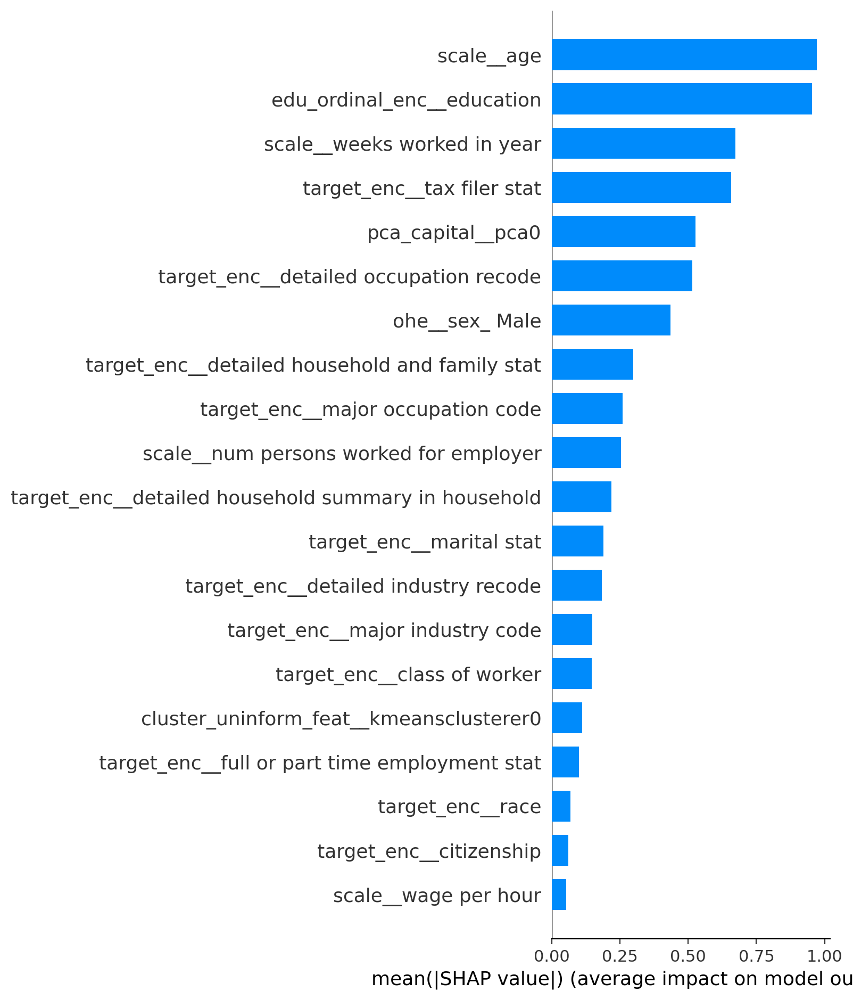

In [89]:
shap.summary_plot(shap_values, features=X_test, feature_names=features_names, plot_type='bar')

Using SHAP we see that for XGBoost the most important features for income prediction are age and education, which seems quite logical.

To interpret results of ensemble and the best model on test data we can look at ensemble weights.

In [90]:
ens.weights

[0.69, 0.31, 0.0]

The first and largest weight corresponds to XGBoost, which is the best model on the test data. The LightGBM model has smaller weights, but it helps to correct the errors of XGBoost.

4.3. Summarize your results and write a conclusion. What have you found in the data, which techniques did you use? Which methods and models worked best in your task? Can you explain in simple words why should we trust your final model?

EDA
1. There are 3229 duplicated rows in the dataset.
2. The target variable `income` is highly imbalanced.
3. The dataset consists of 7 continuous and 33 nominal features.
4. Features in `continuous_outliers_feat` list are likely to have outliers which we should investigate and make a decision about handling them.
5. `country of birth...`, `migration code-change...` features include redundant classes, which could have been handled.
6. Features from `uninform_features` list most likely don't give us much information about target, because \$50k+ target is presented mostly in dominant category of these features. So we should consider applying clustering technique to reduce number of such features or even drop them.
7. Missing values are encoded with the symbol `?`. These are presented mainly in features to which PCA or clustering will be applied.

Preprocessing
1. We converted the target to a binary variable (1, 0).
2. Duplicates and feature `instance weight` were dropped.
3. Capital related features with rather unusual values were transformed using the 1st component of PCA.
4. Categorical features related to country of birth with a dominant class (~80%) of United-States were transformed via one hot encoding and PCA.
5. Categorical features related to migration code were transformed via one hot encoding and PCA.
6. `education` feature was encoded using ordinal encoding.
7. Categorical features with small number of classes were encoded using one hot encoding.
8. Features with poor information about target were encoded via one hot encoding, then transformed via PCA and KMeans.
9. Other categorical features were encoded using target encoding.
10. Numerical features were scaled by StandardScaler.

Model training
1. We used 3 boostings - XGBoost, LightGBM, CatBoost
2. For hyperparameters tuning was used RandomizedSearchCV to accelerate the process.
3. Since target is highly imbalanced as cross-vaidation technique waas used StratifiedKFolds
4. The best models in the training step are models that were fitted on oversampled and undersampled data. But the best results on the test data are shown by models that were fitted on the base data.
5. We can trust the best models (XGBoost and Ensemble) because their interpretation seems quite logical and vital -- occupation, age, education and worked weeks affect income.